In [54]:
import pandas as pd
import numpy as np
import seaborn as sns 

from sklearn import preprocessing
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler

import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from numpy import array

from tensorflow.keras import Sequential
from tensorflow.keras.layers import LSTM,Dense
from tensorflow.keras import optimizers

from tensorflow.keras import regularizers #用正则化来防止过拟合
from tensorflow.keras.layers import Dropout # Dropout 来解决过拟合问题

from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import LabelEncoder

from catboost import CatBoostRegressor

In [55]:
df = pd.read_csv('/Users/qidongfang/Documents/learning/PRSA_Data_Changping_20130301-20170228.csv')
print(df)

          No  year  month  day  hour  PM2.5  PM10   SO2   NO2     CO    O3  \
0          1  2013      3    1     0    3.0   6.0  13.0   7.0  300.0  85.0   
1          2  2013      3    1     1    3.0   3.0   6.0   6.0  300.0  85.0   
2          3  2013      3    1     2    3.0   3.0  22.0  13.0  400.0  74.0   
3          4  2013      3    1     3    3.0   6.0  12.0   8.0  300.0  81.0   
4          5  2013      3    1     4    3.0   3.0  14.0   8.0  300.0  81.0   
...      ...   ...    ...  ...   ...    ...   ...   ...   ...    ...   ...   
35059  35060  2017      2   28    19   28.0  47.0   4.0  14.0  300.0   NaN   
35060  35061  2017      2   28    20   12.0  12.0   3.0  23.0  500.0  64.0   
35061  35062  2017      2   28    21    7.0  23.0   5.0  17.0  500.0  68.0   
35062  35063  2017      2   28    22   11.0  20.0   3.0  15.0  500.0  72.0   
35063  35064  2017      2   28    23   20.0  25.0   6.0  28.0  900.0  54.0   

       TEMP    PRES  DEWP  RAIN   wd  WSPM    station  
0      

In [56]:
# viewing info about the columns
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   No       35064 non-null  int64  
 1   year     35064 non-null  int64  
 2   month    35064 non-null  int64  
 3   day      35064 non-null  int64  
 4   hour     35064 non-null  int64  
 5   PM2.5    34290 non-null  float64
 6   PM10     34482 non-null  float64
 7   SO2      34436 non-null  float64
 8   NO2      34397 non-null  float64
 9   CO       33543 non-null  float64
 10  O3       34460 non-null  float64
 11  TEMP     35011 non-null  float64
 12  PRES     35014 non-null  float64
 13  DEWP     35011 non-null  float64
 14  RAIN     35013 non-null  float64
 15  wd       34924 non-null  object 
 16  WSPM     35021 non-null  float64
 17  station  35064 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 4.8+ MB


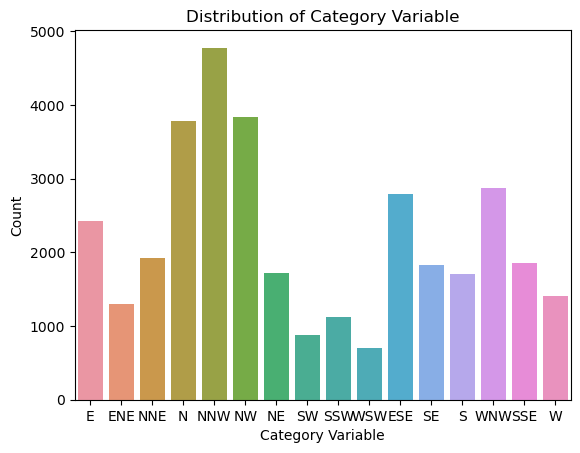

In [61]:
sns.countplot(x="wd", data=df)

# 设置图形标题和轴标签
plt.title("Distribution of Category Variable")
plt.xlabel("Category Variable")
plt.ylabel("Count")

# 显示图形
plt.show()

In [62]:
feature_column = 'wd' #确定需要处理的特征列名
classes = df[feature_column].unique() #找出特征的不同类别

In [63]:
encoder = LabelEncoder()
df[feature_column] = encoder.fit_transform(df[feature_column])#使用标签编码将特征转化为整数形式：

In [64]:
print(df[feature_column]) #检查一下是否转化

0        0
1        1
2        1
3        5
4        3
        ..
35059    5
35060    3
35061    3
35062    7
35063    3
Name: wd, Length: 35064, dtype: int64


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   No       35064 non-null  int64  
 1   year     35064 non-null  int64  
 2   month    35064 non-null  int64  
 3   day      35064 non-null  int64  
 4   hour     35064 non-null  int64  
 5   PM2.5    34290 non-null  float64
 6   PM10     34482 non-null  float64
 7   SO2      34436 non-null  float64
 8   NO2      34397 non-null  float64
 9   CO       33543 non-null  float64
 10  O3       34460 non-null  float64
 11  TEMP     35011 non-null  float64
 12  PRES     35014 non-null  float64
 13  DEWP     35011 non-null  float64
 14  RAIN     35013 non-null  float64
 15  wd       35064 non-null  int64  
 16  WSPM     35021 non-null  float64
 17  station  35064 non-null  object 
dtypes: float64(11), int64(6), object(1)
memory usage: 4.8+ MB


In [11]:
df.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,3.0,6.0,13.0,7.0,300.0,85.0,-2.3,1020.8,-19.7,0.0,0,0.5,Changping
1,2,2013,3,1,1,3.0,3.0,6.0,6.0,300.0,85.0,-2.5,1021.3,-19.0,0.0,1,0.7,Changping
2,3,2013,3,1,2,3.0,3.0,22.0,13.0,400.0,74.0,-3.0,1021.3,-19.9,0.0,1,0.2,Changping
3,4,2013,3,1,3,3.0,6.0,12.0,8.0,300.0,81.0,-3.6,1021.8,-19.1,0.0,5,1.0,Changping
4,5,2013,3,1,4,3.0,3.0,14.0,8.0,300.0,81.0,-3.5,1022.3,-19.4,0.0,3,2.1,Changping


In [12]:
print(df.shape)

(35064, 18)


In [13]:
print(df.describe)

<bound method NDFrame.describe of           No  year  month  day  hour  PM2.5  PM10   SO2   NO2     CO    O3  \
0          1  2013      3    1     0    3.0   6.0  13.0   7.0  300.0  85.0   
1          2  2013      3    1     1    3.0   3.0   6.0   6.0  300.0  85.0   
2          3  2013      3    1     2    3.0   3.0  22.0  13.0  400.0  74.0   
3          4  2013      3    1     3    3.0   6.0  12.0   8.0  300.0  81.0   
4          5  2013      3    1     4    3.0   3.0  14.0   8.0  300.0  81.0   
...      ...   ...    ...  ...   ...    ...   ...   ...   ...    ...   ...   
35059  35060  2017      2   28    19   28.0  47.0   4.0  14.0  300.0   NaN   
35060  35061  2017      2   28    20   12.0  12.0   3.0  23.0  500.0  64.0   
35061  35062  2017      2   28    21    7.0  23.0   5.0  17.0  500.0  68.0   
35062  35063  2017      2   28    22   11.0  20.0   3.0  15.0  500.0  72.0   
35063  35064  2017      2   28    23   20.0  25.0   6.0  28.0  900.0  54.0   

       TEMP    PRES  DEWP  RA

In [14]:
##checking how many null values are in each column
df.isnull().sum()

No            0
year          0
month         0
day           0
hour          0
PM2.5       774
PM10        582
SO2         628
NO2         667
CO         1521
O3          604
TEMP         53
PRES         50
DEWP         53
RAIN         51
wd            0
WSPM         43
station       0
dtype: int64

In [15]:
# dropping all the rows with NaN values
df = df.dropna()

In [16]:
df.isnull().sum()

No         0
year       0
month      0
day        0
hour       0
PM2.5      0
PM10       0
SO2        0
NO2        0
CO         0
O3         0
TEMP       0
PRES       0
DEWP       0
RAIN       0
wd         0
WSPM       0
station    0
dtype: int64

In [17]:
print(df.shape)

(32774, 18)


In [18]:
num = df[df['year']==2016].index[0] #找到数据文件中当年份第一次出现2016时对应的序列号
print(num)

24864


In [19]:
#使用2016年及以后作为测试集
x_train = df[:num]
y_train = x_train['PM2.5']
x_test = df[num:]
y_test = x_test['PM2.5']
print(y_test)

26866     8.0
26867     5.0
26868     9.0
26869     8.0
26870    11.0
         ... 
35057    18.0
35060    12.0
35061     7.0
35062    11.0
35063    20.0
Name: PM2.5, Length: 7910, dtype: float64


In [20]:
df.loc[num:].count()/df.shape[0]*100 #从给定索引开始到数据末尾的特定范围内各列的数据分布情况

No         30.121438
year       30.121438
month      30.121438
day        30.121438
hour       30.121438
PM2.5      30.121438
PM10       30.121438
SO2        30.121438
NO2        30.121438
CO         30.121438
O3         30.121438
TEMP       30.121438
PRES       30.121438
DEWP       30.121438
RAIN       30.121438
wd         30.121438
WSPM       30.121438
station    30.121438
dtype: float64

In [21]:
#Normalize training data
train_norm = x_train['PM2.5']
train_norm_arr = np.asarray(train_norm)
train_norm = np.reshape(train_norm_arr,(-1,1))
scaler = MinMaxScaler(feature_range = (0,1))
train_norm = scaler.fit_transform(train_norm)

In [22]:
#check if any null values are present.
count = 0
for i in range(len(train_norm)):
    if train_norm[i]==0:
        count = count+1
print('Number of null values in train_norm =',count)

Number of null values in train_norm = 480


In [23]:
#removing null values 
train_norm = train_norm[train_norm!=0]

In [24]:
# repeat the same procedure for test_norm.
test_norm = x_test['PM2.5']
test_norm_arr = np.asarray(test_norm)
test_norm = np.reshape(test_norm_arr,(-1,1))
scaler = MinMaxScaler(feature_range = (0,1))
test_norm = scaler.fit_transform(test_norm)

In [25]:
count = 0
for i in range(len(test_norm)):
    if test_norm[i] == 0:
        count = count+1
print('Number of null values in test_norm =',count)

Number of null values in test_norm = 131


In [26]:
test_norm = test_norm[test_norm!=0]

In [27]:
#函数 split_sequence 将序列拆分为 n 个值的集合。 
#该n给出为 n_steps (step_size)。 例如，如果 n=3，我们将序列分成 3 个组。我们创建 2个空列表并附加拆分序列。
def split_sequences(sequence,n_steps):
    X,y = list(),list()
    for i in range(len(sequence)):
        end_ix = i+n_steps
        if end_ix > len(sequence)-1:
            break
        seq_x, seq_y = sequence[i:end_ix],sequence[end_ix]
        X.append(seq_x)
        y.append(seq_y)
    return array(X),array(y)

In [28]:
n_steps = 3
X_split_train,y_split_train = split_sequences(train_norm, n_steps)
n_features = 1
X_split_train = X_split_train.reshape((X_split_train.shape[0],X_split_train.shape[1],n_features))
for i in range(1):
    print(X_split_train)

[[[0.0017301 ]
  [0.01038062]
  [0.01384083]]

 [[0.01038062]
  [0.01384083]
  [0.01038062]]

 [[0.01384083]
  [0.01038062]
  [0.01038062]]

 ...

 [[0.00346021]
  [0.0017301 ]
  [0.01038062]]

 [[0.0017301 ]
  [0.01038062]
  [0.01211073]]

 [[0.01038062]
  [0.01211073]
  [0.01557093]]]


In [29]:
#我们预测前 3 个值的值，然后将该输出视为下一组中的 3 个值之一。 例如，我们首先预测 0.1，然后将 0.1 作为第二组的输入，依此类推。
X_split_test,y_split_test = split_sequences(test_norm, n_steps)
for i in range(5):
    print(X_split_test[i],y_split_test[i])
n_features = 1
X_split_test = np.reshape(X_split_test,(X_split_test.shape[0],X_split_test.shape[1],n_features))

[0.00758725 0.0030349  0.0091047 ] 0.007587253414264037
[0.0030349  0.0091047  0.00758725] 0.01213960546282246
[0.0091047  0.00758725 0.01213961] 0.0030349013657056147
[0.00758725 0.01213961 0.0030349 ] 0.015174506828528072
[0.01213961 0.0030349  0.01517451] 0.0212443095599393


In [30]:
# define model
model = Sequential()
# #正则化方法解决过拟合
# model.add(LSTM(50, activation='relu', input_shape=(n_steps, n_features),
#                kernel_regularizer=regularizers.l2(0.01),
#                recurrent_regularizer=regularizers.l2(0.01)))

#用dropout方法解决过拟合问题
model.add(LSTM(50, activation='relu', input_shape=(n_steps, n_features)))
model.add(Dropout(0.2)) 

#不用任何方法解决过拟合
# model.add(LSTM(50, activation='relu', input_shape = (n_steps,n_features)))
model.add(Dense(1))
sgd = optimizers.SGD(lr = 0.001, decay = 1e-5, momentum = 0.9, nesterov=True)
adam_optimizer = keras.optimizers.Adam(learning_rate = 0.001, beta_1=0.9, beta_2=0.999, amsgrad=False)
model.compile(optimizer = 'sgd',loss='mse', metrics=['accuracy'])

2023-09-20 13:32:39.408197: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
/Users/qidongfang/opt/anaconda3/lib/python3.9/site-packages/keras/optimizer_v2/gradient_descent.py:102: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(SGD, self).__init__(name, **kwargs)


In [31]:
# fit model
hist=model.fit(X_split_train,y_split_train,validation_data=(X_split_test,y_split_test),epochs=10,verbose=1)

Epoch 1/10
762/762 [==============================] - 3s 2ms/step - loss: 0.0125 - accuracy: 0.0000e+00 - val_loss: 0.0076 - val_accuracy: 0.0000e+00
Epoch 2/10
762/762 [==============================] - 1s 2ms/step - loss: 0.0098 - accuracy: 0.0000e+00 - val_loss: 0.0064 - val_accuracy: 0.0000e+00
Epoch 3/10
762/762 [==============================] - 2s 2ms/step - loss: 0.0081 - accuracy: 0.0000e+00 - val_loss: 0.0052 - val_accuracy: 0.0000e+00
Epoch 4/10
762/762 [==============================] - 1s 2ms/step - loss: 0.0070 - accuracy: 0.0000e+00 - val_loss: 0.0044 - val_accuracy: 0.0000e+00
Epoch 5/10
762/762 [==============================] - 1s 2ms/step - loss: 0.0060 - accuracy: 0.0000e+00 - val_loss: 0.0037 - val_accuracy: 0.0000e+00
Epoch 6/10
762/762 [==============================] - 1s 2ms/step - loss: 0.0051 - accuracy: 0.0000e+00 - val_loss: 0.0031 - val_accuracy: 0.0000e+00
Epoch 7/10
762/762 [==============================] - 2s 2ms/step - loss: 0.0045 - accuracy: 0.0000e

In [32]:
print(hist.history.keys())

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


In [33]:
#make our predictions using model.predict.
yhat = model.predict(X_split_test)
for i in range(5):
    print(yhat[i])

[0.03436419]
[0.03455684]
[0.03620841]
[0.0350087]
[0.03655246]


In [34]:
mse = mean_squared_error(y_split_test,yhat)
print('mse:%.5f'%mse)

mse:0.00175


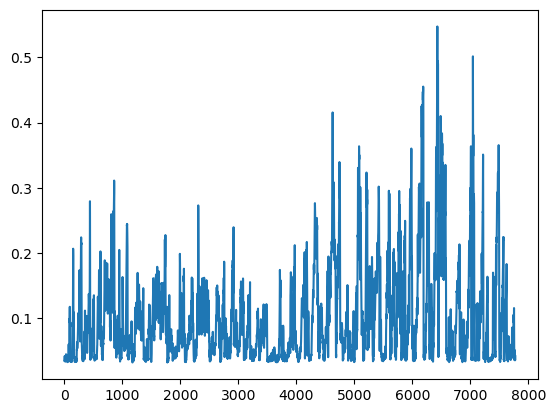

In [35]:
plt.plot(yhat)

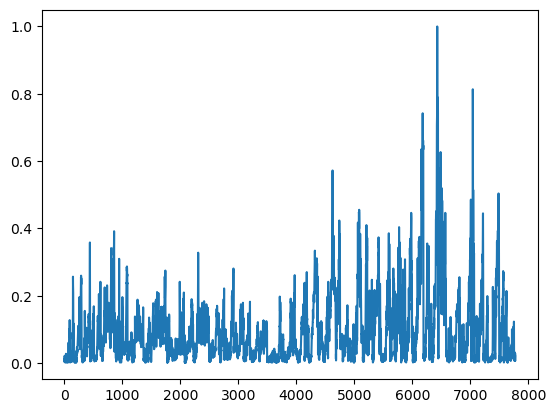

In [36]:
plt.plot(y_split_test)

In [37]:
#方法会返回一个包含两个值的元组：损失值和度量指标的值。对准确率（度量指标）感兴趣，而不关心损失值。
#使用 _ 变量来接收第一个值，也就是损失值。这是一个惯例，表示我们暂时不关心该值，只是将其丢弃。
#使用 train_acc 变量来接收第二个值，也就是训练集上的准确率。
_,train_acc = model.evaluate(X_split_train,y_split_train,verbose = 0)
_,test_acc = model.evaluate(X_split_test,y_split_test, verbose = 0)
print('Train: %.6f, Test:%.5f'%(train_acc,test_acc))

Train: 0.000000, Test:0.00013


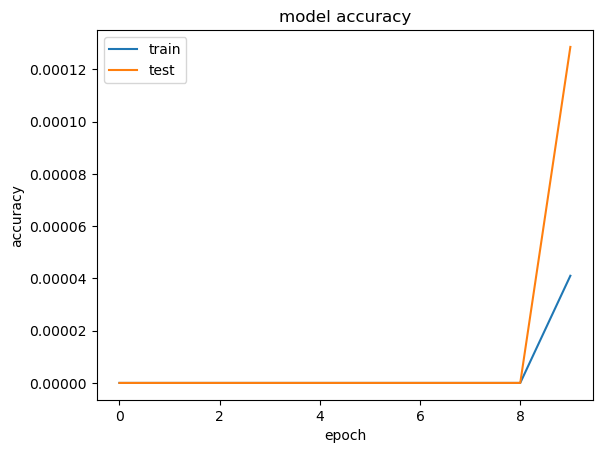

In [38]:
# summarize history for accuracy
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train','test'], loc='upper left')
plt.show()

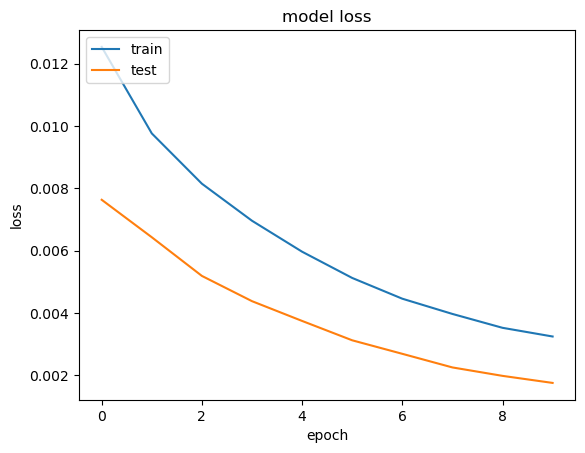

In [39]:
# summarize history for loss
plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train','test'],loc = 'upper left')
plt.show()

In [40]:
def compute(var):
    train_norm = x_train[var]
    train_norm_arr = np.asarray(train_norm)
    train_norm = np.reshape(train_norm_arr,(-1,1))
    scaler = MinMaxScaler(feature_range = (0,1))
    train_norm = scaler.fit_transform(train_norm)
    
    test_norm = x_test[var]
    test_norm_arr = np.asarray(test_norm)
    test_norm = np.reshape(test_norm_arr,(-1,1))
    scaler = MinMaxScaler(feature_range = (0,1))
    test_norm = scaler.fit_transform(test_norm)
    
    X_split_train, y_split_train = split_sequences(train_norm, n_steps)
    X_split_train = X_split_train.reshape(X_split_train.shape[0],X_split_train.shape[1],n_features)
    
    X_split_test,y_split_test = split_sequences(test_norm, n_steps)
    X_split_test = X_split_test.reshape(X_split_test.shape[0],X_split_test.shape[1],n_features)
    
    hist = model.fit(X_split_train, y_split_train, validation_data = (X_split_test,y_split_test), epochs = 10, verbose = 1)
    
    yhat = model.predict(X_split_test)
    
    mse = mean_squared_error(y_split_test, yhat)
    print('MSE: %f'%mse)
    
    plt.plot(hist.history['accuracy'])
    plt.plot(hist.history['val_accuracy'])
    plt.title('model accuarcy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train','test'],loc = 'upper left')
    plt.show()
    
    plt.plot(hist.history['loss'])
    plt.plot(hist.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train','test'], loc = 'upper left')
    plt.show()

Epoch 1/10
777/777 [==============================] - 3s 3ms/step - loss: 0.0015 - accuracy: 0.0134 - val_loss: 0.0029 - val_accuracy: 0.4340
Epoch 2/10
777/777 [==============================] - 2s 3ms/step - loss: 0.0014 - accuracy: 0.0134 - val_loss: 0.0028 - val_accuracy: 0.4340
Epoch 3/10
777/777 [==============================] - 2s 3ms/step - loss: 0.0013 - accuracy: 0.0134 - val_loss: 0.0028 - val_accuracy: 0.4340
Epoch 4/10
777/777 [==============================] - 2s 3ms/step - loss: 0.0013 - accuracy: 0.0134 - val_loss: 0.0028 - val_accuracy: 0.4340
Epoch 5/10
777/777 [==============================] - 2s 2ms/step - loss: 0.0012 - accuracy: 0.0134 - val_loss: 0.0028 - val_accuracy: 0.4340
Epoch 6/10
777/777 [==============================] - 2s 2ms/step - loss: 0.0012 - accuracy: 0.0134 - val_loss: 0.0028 - val_accuracy: 0.4340
Epoch 7/10
777/777 [==============================] - 2s 3ms/step - loss: 0.0012 - accuracy: 0.0134 - val_loss: 0.0028 - val_accuracy: 0.4340
Epoch 

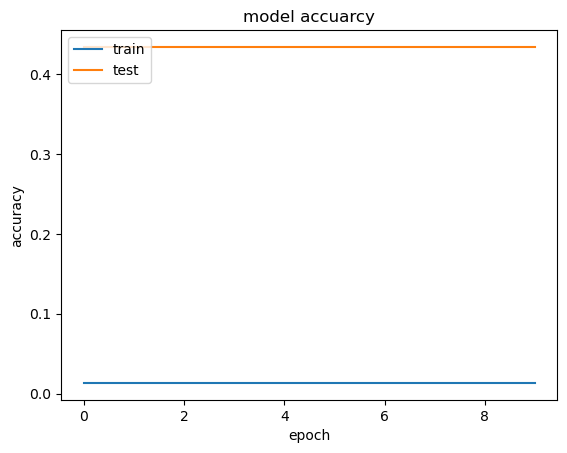

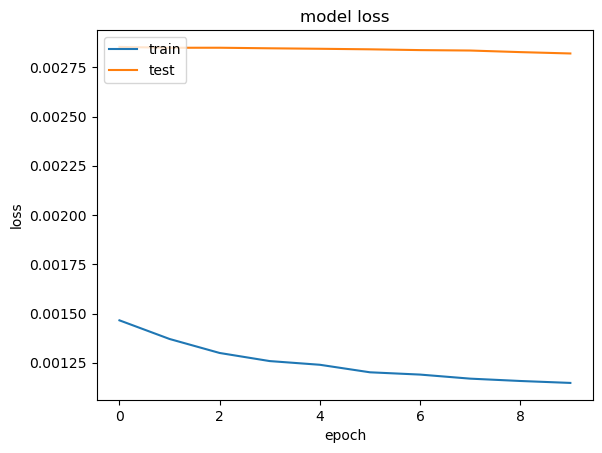

In [41]:
#compute('PM2.5')
#compute('PM10')
compute('SO2')
#compute('NO2')
#compute('CO')
#compute('O3')

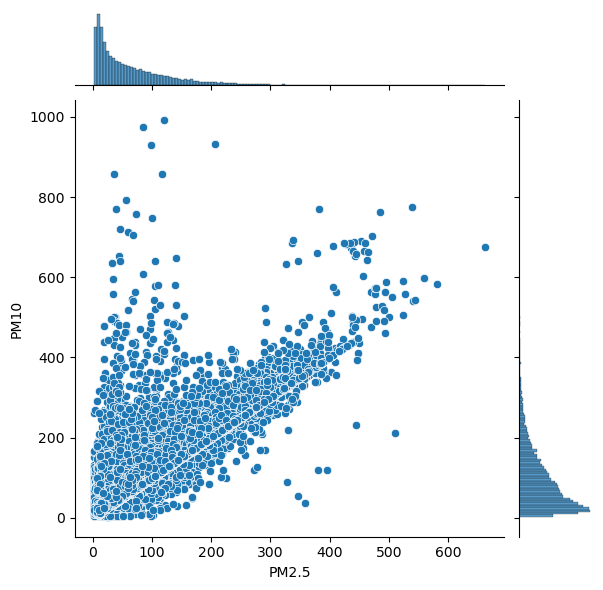

In [42]:
#jointplot for PM2.5 concentration and PM10 concentration
sns.jointplot(x=df['PM2.5'], y=df['PM10'],data = df)

<AxesSubplot:>

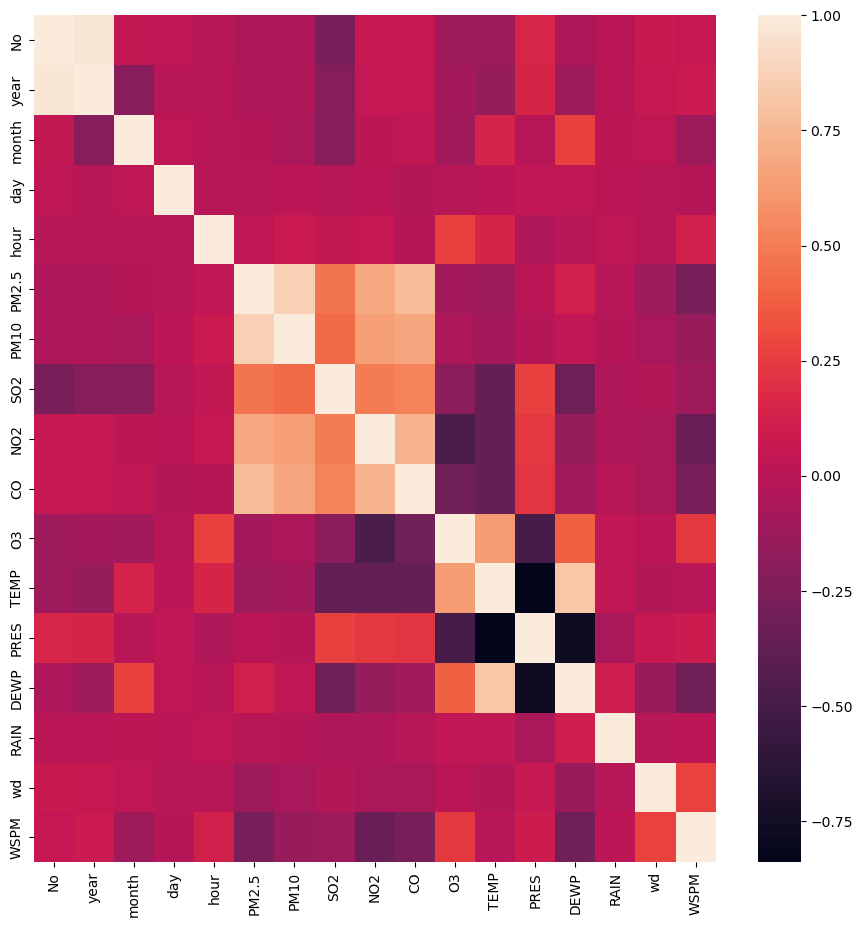

In [43]:
#finding correlation
corrmat = df.corr()
fig, ax = plt.subplots(figsize = (11,11))

#Heatmap
sns.heatmap(corrmat)

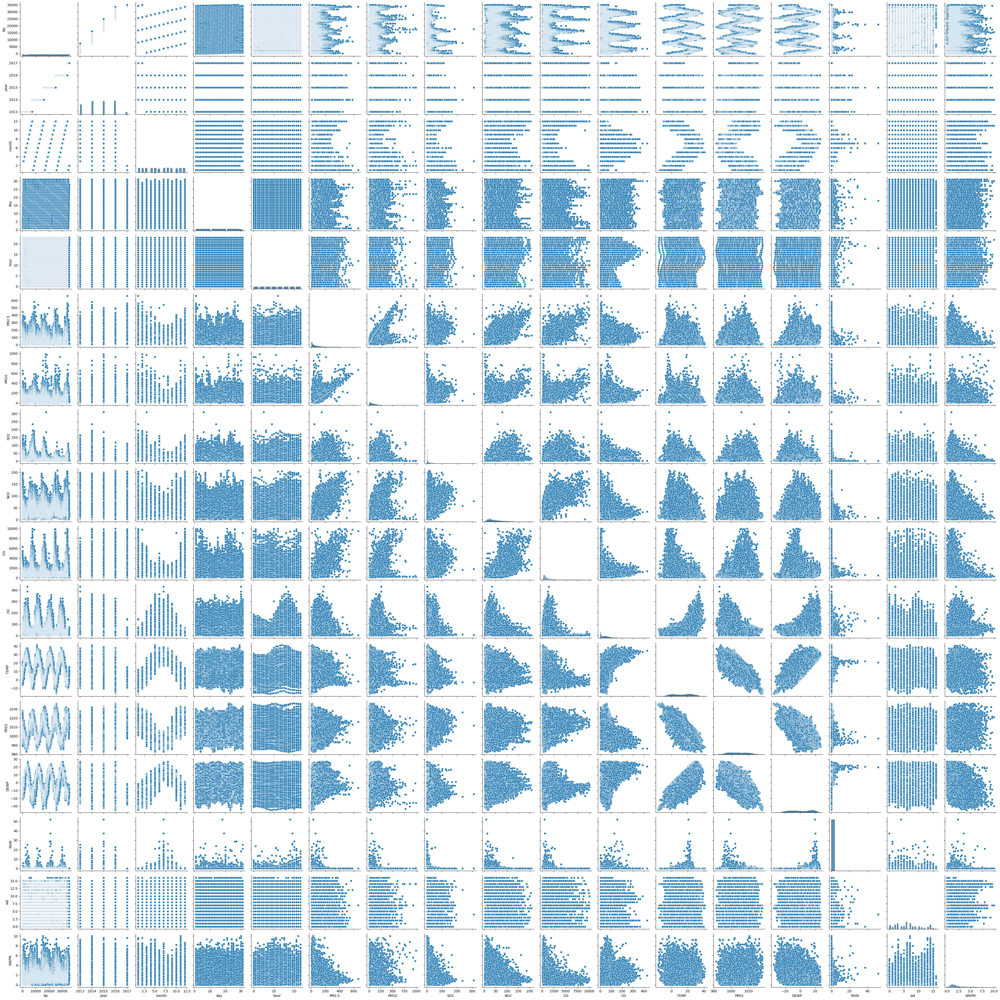

In [44]:
#To generate pairplots for all features.
g = sns.pairplot(df)

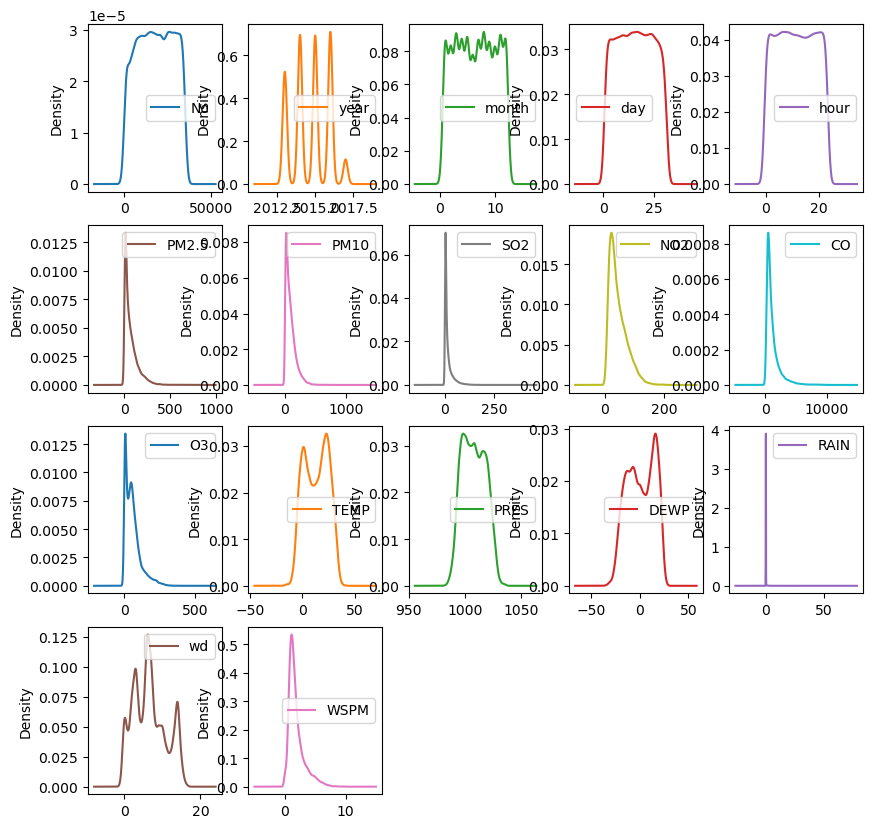

In [45]:
#density plots
df.plot(kind = 'density', subplots = True, layout = (4,5), sharex = False, figsize = (10,10))
plt.show()

<AxesSubplot:xlabel='PM2.5', ylabel='PM10'>

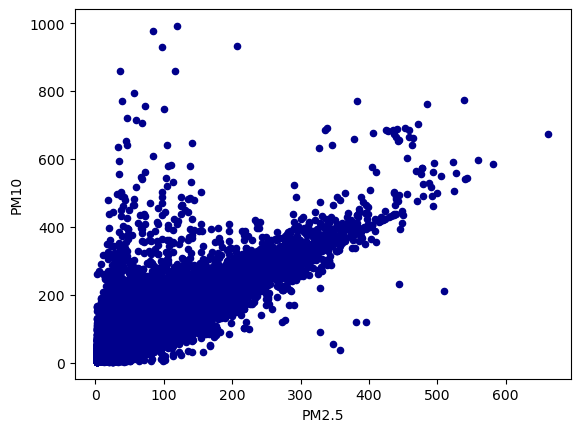

In [46]:
#scatter plots
df.plot.scatter(x='PM2.5', y='PM10', c='DarkBlue')

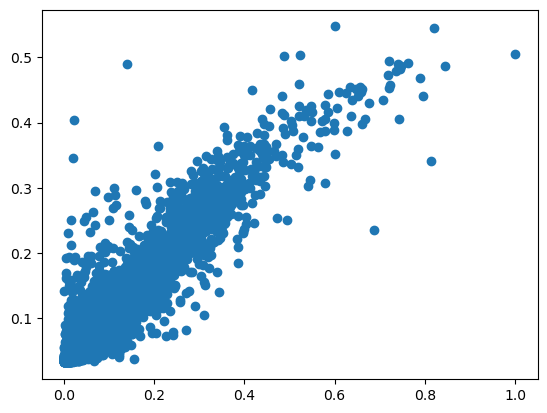

In [47]:
plt.scatter(y_split_test,yhat)

<AxesSubplot:xlabel='PM10', ylabel='SO2'>

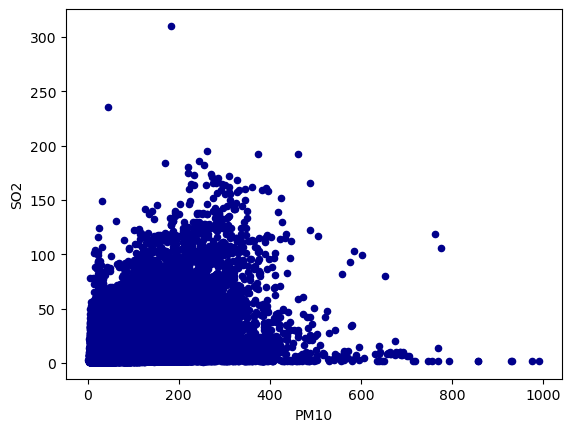

In [48]:
df.plot.scatter(x='PM10',y='SO2',c='DarkBlue')

<AxesSubplot:xlabel='SO2', ylabel='NO2'>

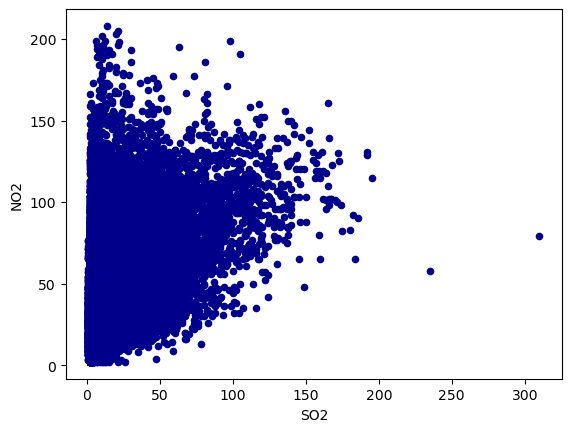

In [49]:
df.plot.scatter(x = 'SO2', y='NO2', c='DarkBlue')

<AxesSubplot:xlabel='NO2', ylabel='CO'>

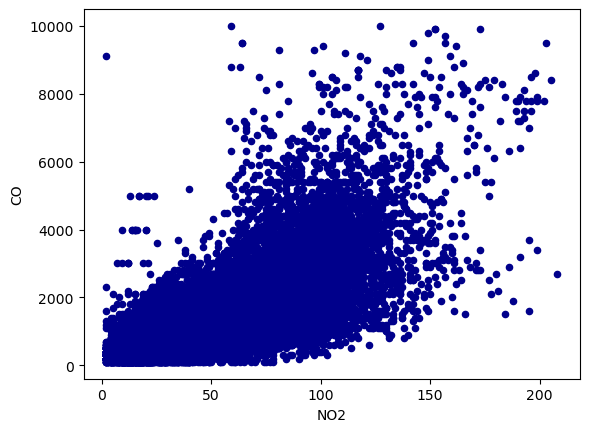

In [50]:
df.plot.scatter(x = 'NO2', y = 'CO', c='DarkBlue')

<AxesSubplot:xlabel='CO', ylabel='O3'>

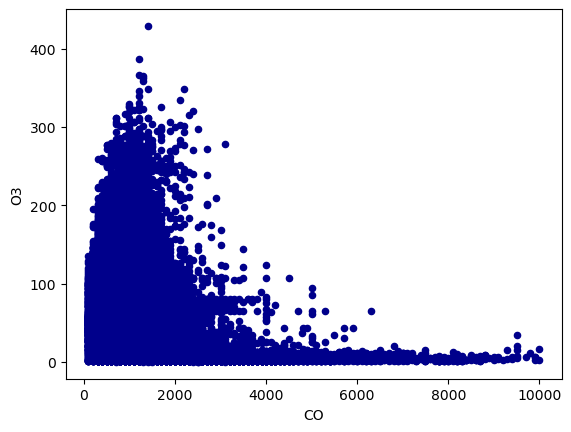

In [51]:
df.plot.scatter(x = 'CO', y='O3', c='DarkBlue')

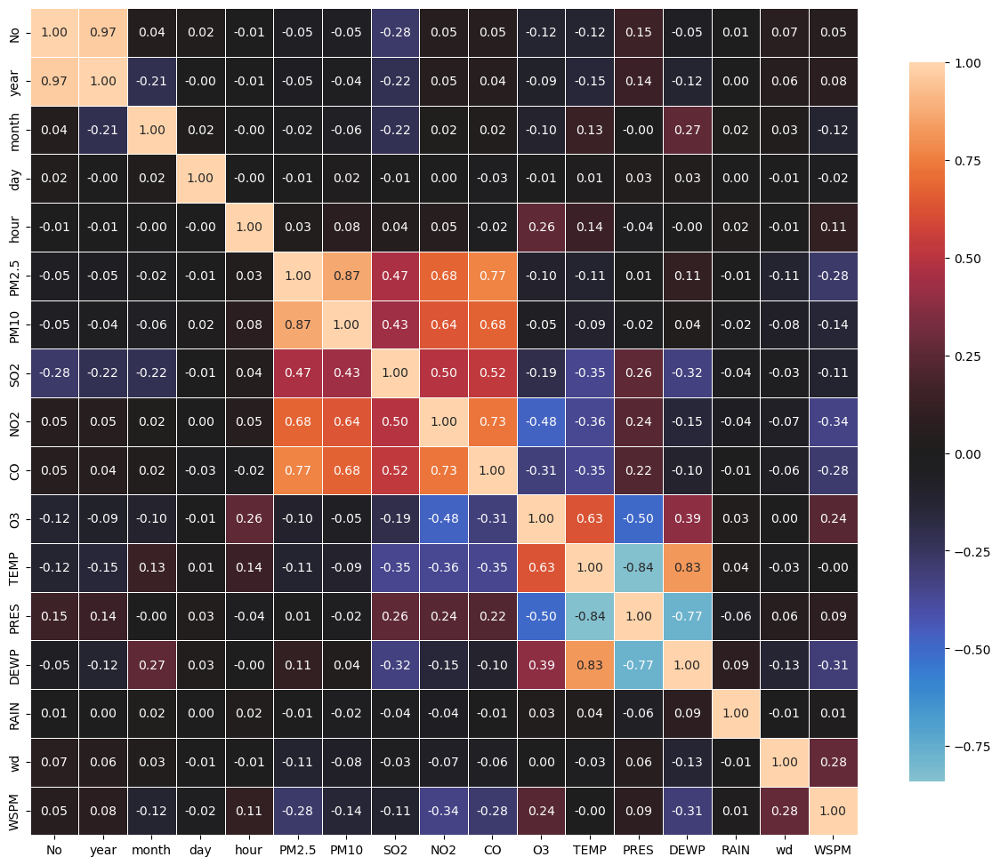

In [52]:
correlations = df.corr()
fig, ax=plt.subplots(figsize=(15,15))
sns.heatmap(correlations, vmax=1.0, center=0, fmt='.2f', square = True, linewidth=.5, annot=True, cbar_kws={'shrink':.70})
plt.show()

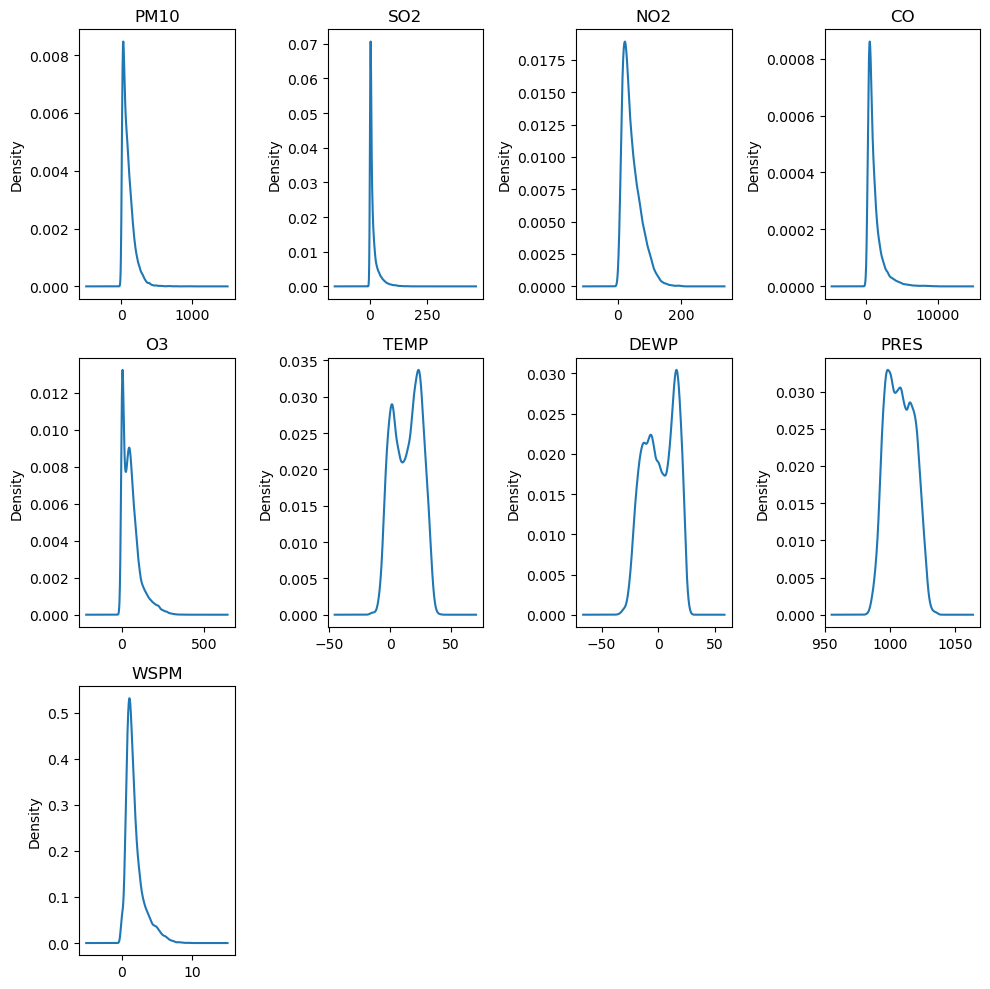

In [60]:
# 指定要绘制密度图的变量列表
variables_of_interest = ['PM10', 'SO2', 'NO2', 'CO','O3','TEMP','DEWP','PRES','WSPM']

# 计算要绘制的密度图的子图布局
num_vars = len(variables_of_interest)
rows = (num_vars + 4 - 1) // 4  # 计算行数（每行最多显示4个子图）
cols = min(num_vars, 4)  # 计算列数（最多显示4列子图）

# 创建子图布局并绘制密度图
fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(10, 10))

for i, var in enumerate(variables_of_interest):
    row = i // cols
    col = i % cols
    ax = axes[row][col] if rows > 1 else axes[col]
    df[var].plot(kind='density', ax=ax)
    ax.set_title(var)

# 删除多余的子图
if num_vars < rows * cols:
    for i in range(num_vars, rows * cols):
        row = i // cols
        col = i % cols
        fig.delaxes(axes[row][col])

plt.tight_layout()

# 显示图形
plt.show()

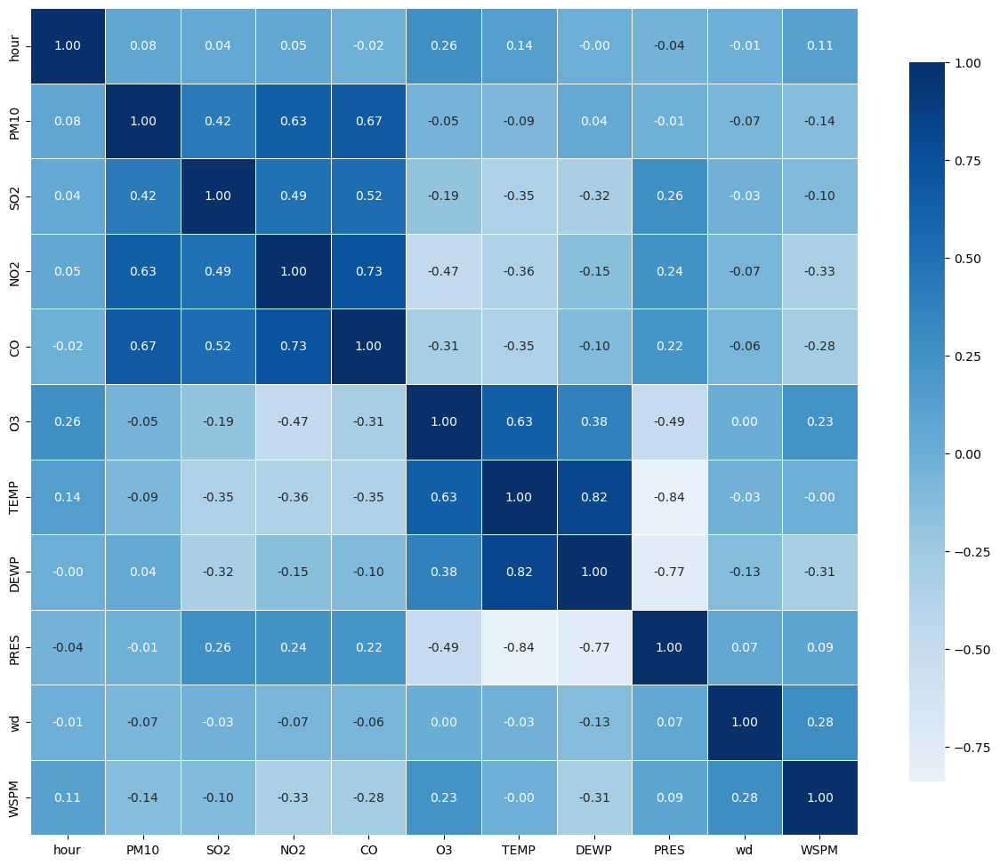

In [74]:
# 指定要保留的变量列表
variables_of_interest = ['hour','PM10',  'SO2', 'NO2', 'CO','O3','TEMP','DEWP','PRES','wd','WSPM']

# 根据变量列表创建新的 DataFrame
df_selected = df[variables_of_interest]

# 计算所选变量之间的相关性
correlations = df_selected.corr()

# 绘制相关性热图
fig, ax = plt.subplots(figsize=(15, 15))
sns.heatmap(correlations, vmax=1.0, center=0, fmt='.2f', square=True, linewidth=.5, annot=True, cbar_kws={'shrink': .70},cmap='Blues')

plt.show()

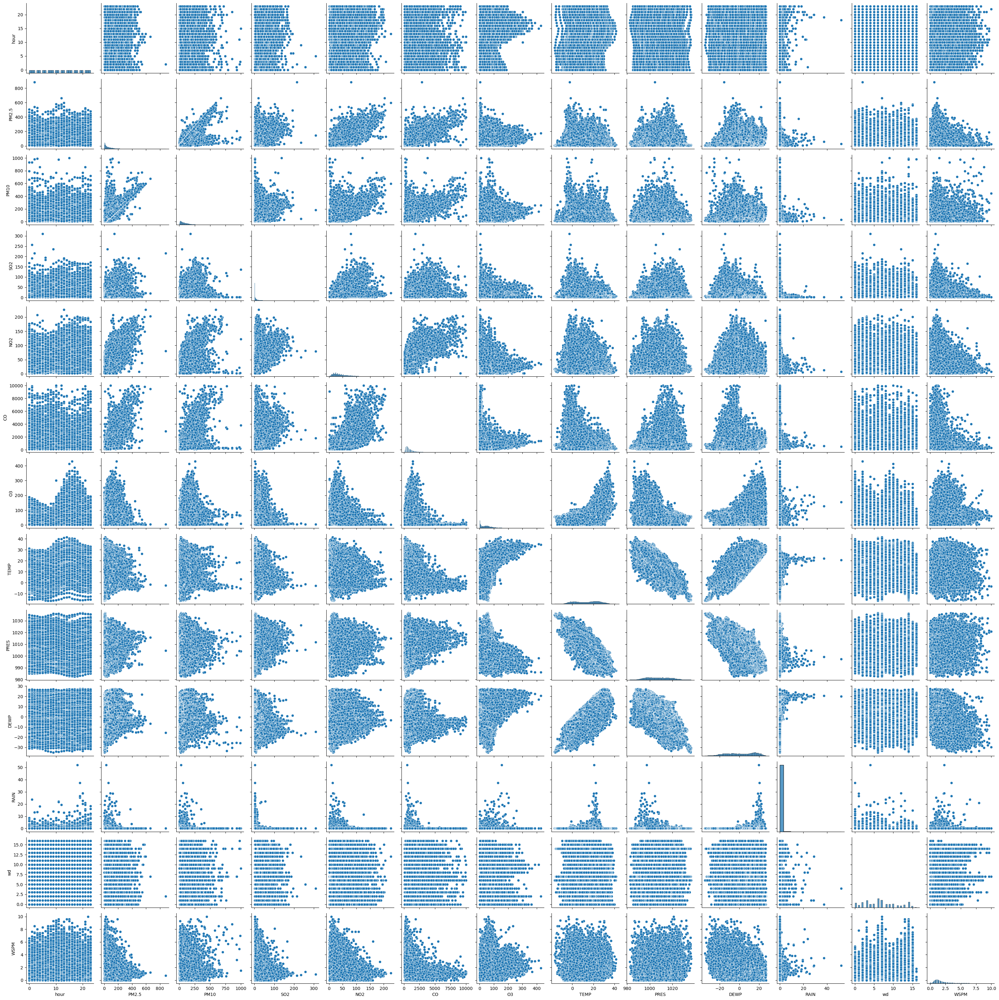

In [75]:
exclude_vars = ['No', 'year','month','day','station']

# 使用 vars 参数来指定要显示的变量列表
g = sns.pairplot(df, vars=[col for col in df.columns if col not in exclude_vars])